In [1]:
%matplotlib inline

In [147]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

In [110]:
IN_PATH = '/home/anjuni/methylation_calling/nanopore/output/contig_019/mfreq'
BED_PATH = '/home/anjuni/methylation_calling/pacbio/input/sorted_bed_files'
TE_PATH = '/home/anjuni/analysis/gff_output'
GENE_PATH = '/home/anjuni/analysis/annotations'

TE = os.path.join(TE_PATH, 'Pst_104E_v13_p_ctg.TE.gff3')
gene =os.path.join(GENE_PATH, 'Pst_104E_v13_p_ctg.anno.gff3')
pb = os.path.join(BED_PATH, '6mA_prob_smrtlink_sorted.bed')
tombo_c = os.path.join(BED_PATH, '5mC_hc_tombo_sorted.bed')
tombo_a = os.path.join(BED_PATH, '6mA_hc_tombo_sorted.bed')

In [41]:
contig = ['pcontig_019']
anno_list = [TE, gene]

In [88]:
#define functions to filter out contig_019 from annotation files
def gff_to_df(gff_file):
    """Convert gff file into a Pandas dataframe."""
    gff_header_list = ['seqname', 'source', 'feature', 'start', 'end', 'score', 'strand', 'frame', 'attribute']
    df = pd.read_csv(gff_file, sep='\t', header = None, names = gff_header_list)
    return df

def bed_to_df(bed_file):
    """Convert gff file into a Pandas dataframe."""
    bed_header_list = ['chrom', 'chromStart', 'chromEnd', 'name', 'score', 'strand',]
    df = pd.read_csv(bed_file, sep='\t', header = None, names = bed_header_list)
    return df

def filter_gff(gff_df, contig_list):
    filtered_df = gff_df[gff_df['seqname'].isin(contig_list)]
    return filtered_df

def filter_bed(bed_df, contig_list):
    filtered_df = bed_df[bed_df['chrom'].isin(contig_list)]
    return filtered_df

In [47]:
initial_te = gff_to_df(TE)
te_df = filter_gff(initial_te, contig)

initial_gene = gff_to_df(gene)
gene_df = filter_gff(initial_gene, contig)

initial_pb = bed_to_df(pb)
pb_df = filter_bed(initial_pb, contig)

In [114]:
initial_tc = bed_to_df(tombo_c)
tc_df = filter_bed(initial_tc, contig)

initial_ta = bed_to_df(tombo_a)
ta_df = filter_bed(initial_ta, contig)

In [119]:
pb_df.head()

,chrom,chromStart,chromEnd,name,score,strand
59693,pcontig_019,6470,6471,6mA,0.998741,-
59694,pcontig_019,6679,6680,6mA,0.999499,+
59695,pcontig_019,9745,9746,6mA,0.999842,+
59696,pcontig_019,10259,10260,6mA,0.998415,-
59697,pcontig_019,10874,10875,6mA,0.999499,-


In [118]:
tc_df.head()

,chrom,chromStart,chromEnd,name,score,strand
46518228,pcontig_019,11,12,5mC,1.0,-
46518229,pcontig_019,14,15,5mC,1.0,-
46518230,pcontig_019,15,16,5mC,1.0,-
46518231,pcontig_019,22,23,5mC,1.0,+
46518232,pcontig_019,28,29,5mC,1.0,-


In [116]:
ta_df.head()

,chrom,chromStart,chromEnd,name,score,strand
57633284,pcontig_019,8,9,6mA,0.5,-
57633285,pcontig_019,9,10,6mA,0.5,-
57633286,pcontig_019,18,19,6mA,1.0,-
57633287,pcontig_019,20,21,6mA,1.0,-
57633288,pcontig_019,23,24,6mA,1.0,+


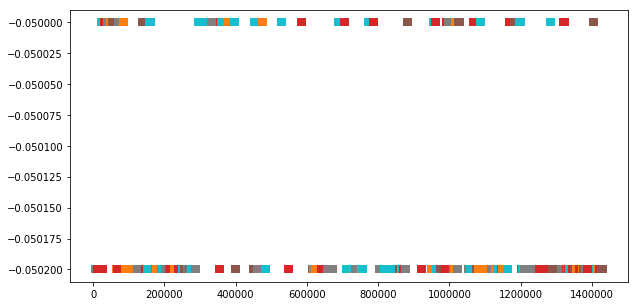

In [113]:
fig, ax = plt.subplots(figsize=(10, 5))
for x1, x2 in zip(te_df.start, te_df.end):
    plt.plot((x1,x2), (-0.05,-0.05), lw = 8)
for x1, x2 in zip(gene_df.start, gene_df.end):
    plt.plot((x1,x2), (-0.0502,-0.0502), lw = 8)

In [4]:
# make dataframes of the nanopolish data from the two mapping programs (minimap2, NGMLR)
minimap2_df = pd.read_csv(os.path.join(IN_PATH,'contig_019_methylation_frequency_minimap2.tsv' ), sep='\t')
ngmlr_df =  pd.read_csv(os.path.join(IN_PATH,'contig_019_methylation_frequency_ngmlr.tsv' ), sep='\t')

In [5]:
minimap2_df.head()

,chromosome,start,end,num_cpgs_in_group,called_sites,called_sites_methylated,methylated_frequency,group_sequence
0,pcontig_019,27,27,1,4,4,1.0,CAGTGCGCAAA
1,pcontig_019,48,48,1,5,5,1.0,CAGTGCGCAAA
2,pcontig_019,61,61,1,5,4,0.8,ATGTCCGTTTT
3,pcontig_019,175,175,1,5,4,0.8,TTTCCCGTCTC
4,pcontig_019,618,618,1,5,2,0.4,TGTGTCGGTTT


In [6]:
minimap2_df.tail()

,chromosome,start,end,num_cpgs_in_group,called_sites,called_sites_methylated,methylated_frequency,group_sequence
46795,pcontig_019,1434884,1434884,1,28,27,0.964,TATGGCGAGCA
46796,pcontig_019,1434924,1434924,1,31,28,0.903,TGTTCCGTATG
46797,pcontig_019,1434935,1434935,1,49,47,0.959,GTGAGCGGCAA
46798,pcontig_019,1434967,1434967,1,25,24,0.960,TAGACCGAAGT
46799,pcontig_019,1434978,1434978,1,22,21,0.955,GATAACGGCTA


In [10]:
minimap2_hc_df = minimap2_df[(minimap2_df.called_sites >20)]
ngmlr_hc_df =ngmlr_df[ngmlr_df.called_sites>20]

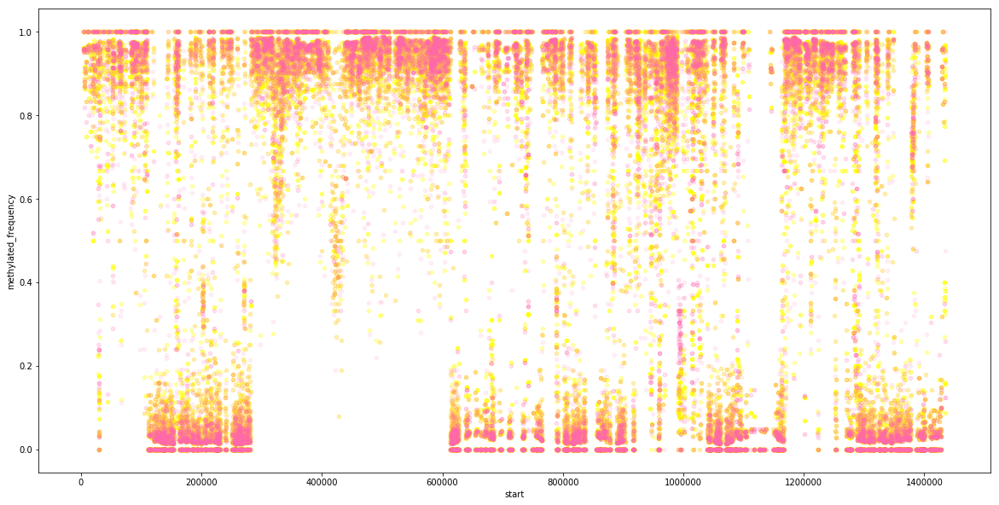

In [11]:
fig, ax = plt.subplots(figsize=(20, 10))
minimap2_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.3, color='yellow')
ngmlr_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.1, color='hotpink')

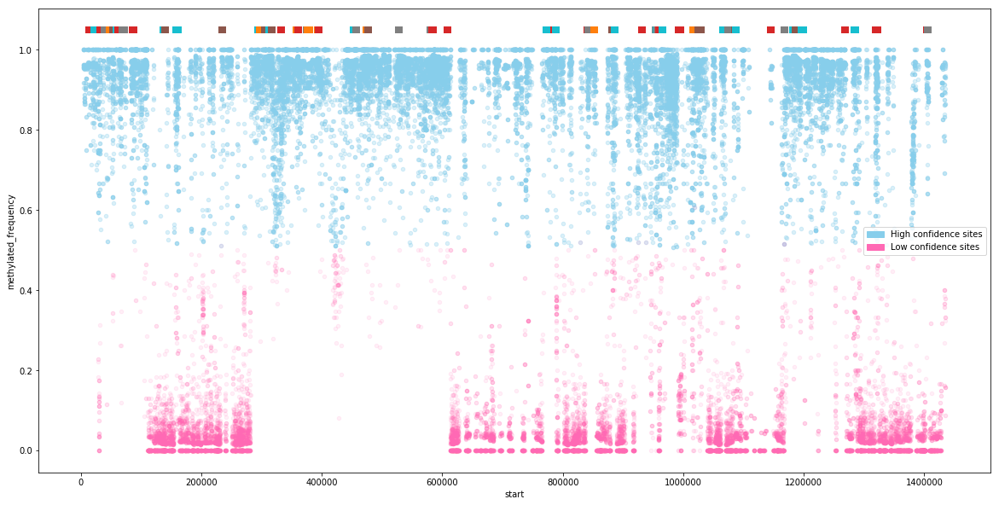

In [151]:
# 5mC and TE
minimap2_hc_df = minimap2_df[(minimap2_df.called_sites > 20) & (minimap2_df.methylated_frequency > 0.5)]
minimap2_lc_df =minimap2_df[(minimap2_df.called_sites > 20) & (ngmlr_df.methylated_frequency < 0.5)]

fig, ax = plt.subplots(figsize=(20, 10))
for x1, x2 in zip(te_df.start, te_df.end):
    plt.plot((x1,x2), (1.05, 1.05), lw = 8)
minimap2_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.3, color='skyblue')
minimap2_lc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.1, color='hotpink')
red_patch = mpatches.Patch(color='hotpink', label='Low confidence sites')
blue_patch = mpatches.Patch(color='skyblue', label='High confidence sites')
plt.legend(handles=[blue_patch, red_patch], loc = 'right')

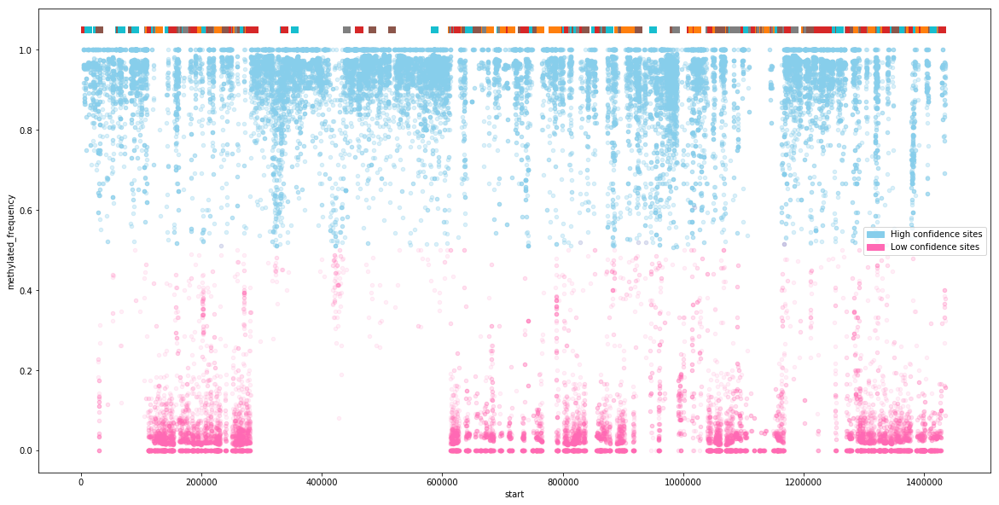

In [152]:
#5mC and genes
minimap2_hc_df = minimap2_df[(minimap2_df.called_sites > 20) & (minimap2_df.methylated_frequency > 0.5)]
minimap2_lc_df =minimap2_df[(minimap2_df.called_sites > 20) & (ngmlr_df.methylated_frequency < 0.5)]

fig, ax = plt.subplots(figsize=(20, 10))
for x1, x2 in zip(gene_df.start, gene_df.end):
    plt.plot((x1,x2), (1.05, 1.05), lw = 8)
minimap2_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.3, color='skyblue')
minimap2_lc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.1, color='hotpink')
red_patch = mpatches.Patch(color='hotpink', label='Low confidence sites')
blue_patch = mpatches.Patch(color='skyblue', label='High confidence sites')
plt.legend(handles=[blue_patch, red_patch], loc = 'right')

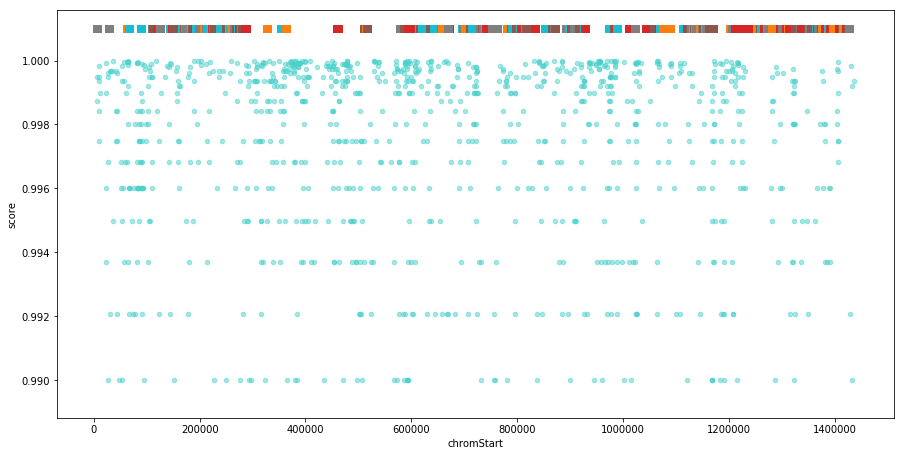

In [109]:
#6mA and genes
fig, ax = plt.subplots(figsize=(15, 7.5))
for x1, x2 in zip(gene_df.start, gene_df.end):
    plt.plot((x1,x2), (1.001, 1.001),  lw = 8)
pb_df.plot(y='score', x='chromStart', kind='scatter', ax=ax, alpha=0.5, color='mediumturquoise')

In [133]:
tc_hc_df = tc_df[(tc_df.score > 0.9)]
tc_lc_df =tc_df[(tc_df.score < 0.9)]
ta_hc_df = ta_df[(ta_df.score > 0.9)]
ta_lc_df =ta_df[(ta_df.score < 0.9)]

In [141]:
tc_hc_df = tc_df[(tc_df.score > 0.5)]
tc_lc_df =tc_df[(tc_df.score < 0.5)]
ta_hc_df = ta_df[(ta_df.score > 0.5)]
ta_lc_df =ta_df[(ta_df.score < 0.5)]

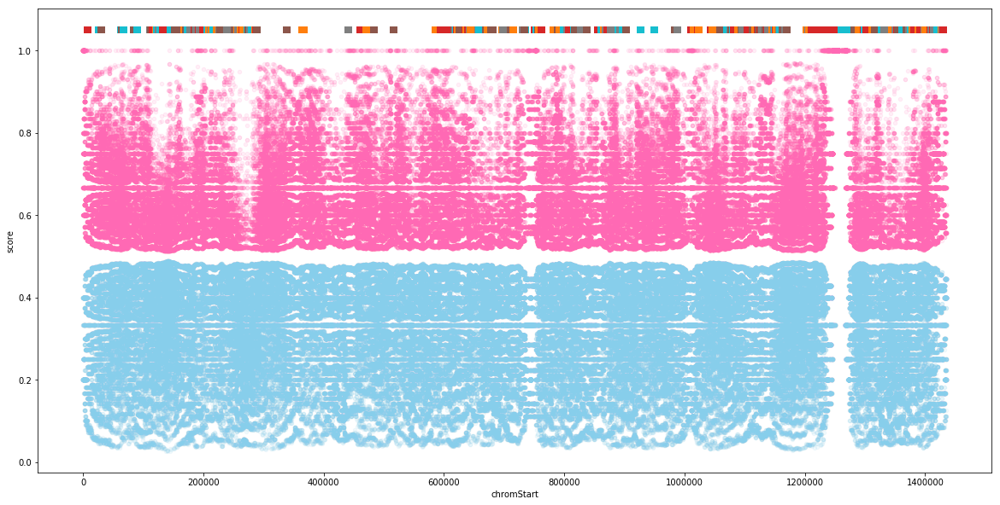

In [142]:
fig, ax = plt.subplots(figsize=(20, 10))
for x1, x2 in zip(gene_df.start, gene_df.end):
    plt.plot((x1,x2), (1.05, 1.05), lw = 8)
tc_lc_df.plot(y='score', x='chromStart', kind='scatter', ax=ax, alpha=0.1, color='skyblue')
tc_hc_df.plot(y='score', x='chromStart', kind='scatter', ax=ax, alpha=0.1, color='hotpink')

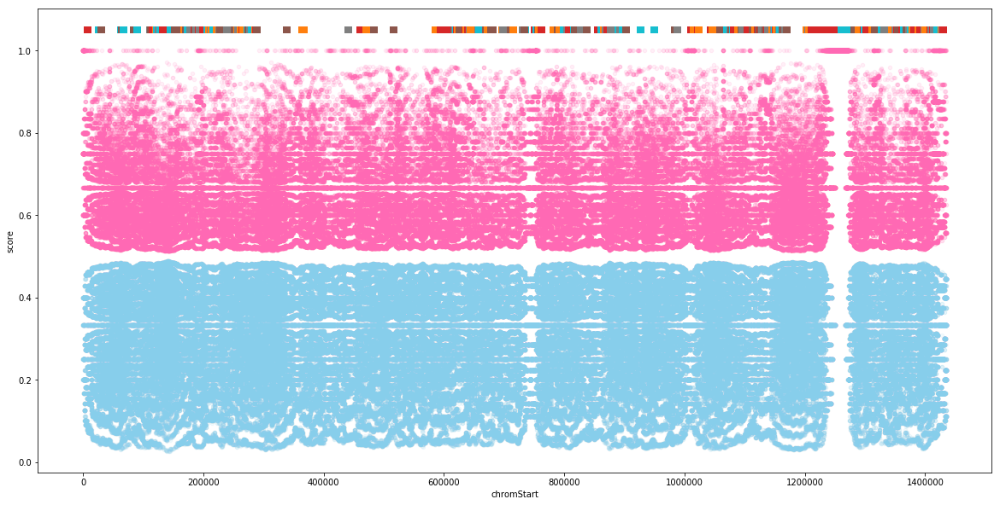

In [143]:
fig, ax = plt.subplots(figsize=(20, 10))
for x1, x2 in zip(gene_df.start, gene_df.end):
    plt.plot((x1,x2), (1.05, 1.05), lw = 8)
ta_lc_df.plot(y='score', x='chromStart', kind='scatter', ax=ax, alpha=0.1, color='skyblue')
ta_hc_df.plot(y='score', x='chromStart', kind='scatter', ax=ax, alpha=0.1, color='hotpink')

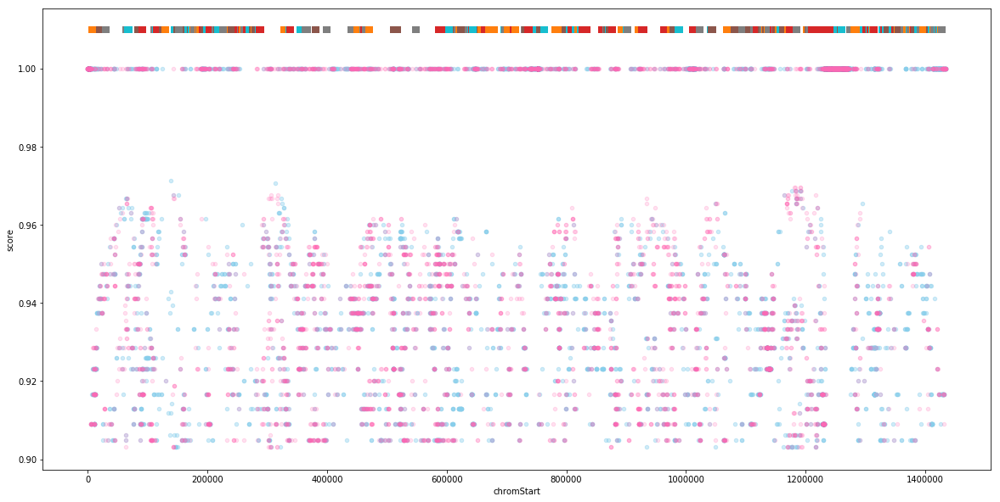

In [140]:
fig, ax = plt.subplots(figsize=(20, 10))
for x1, x2 in zip(gene_df.start, gene_df.end):
    plt.plot((x1,x2), (1.01, 1.01), lw = 8)
ta_hc_df.plot(y='score', x='chromStart', kind='scatter', ax=ax, alpha=0.4, color='skyblue')
tc_hc_df.plot(y='score', x='chromStart', kind='scatter', ax=ax, alpha=0.2, color='hotpink')

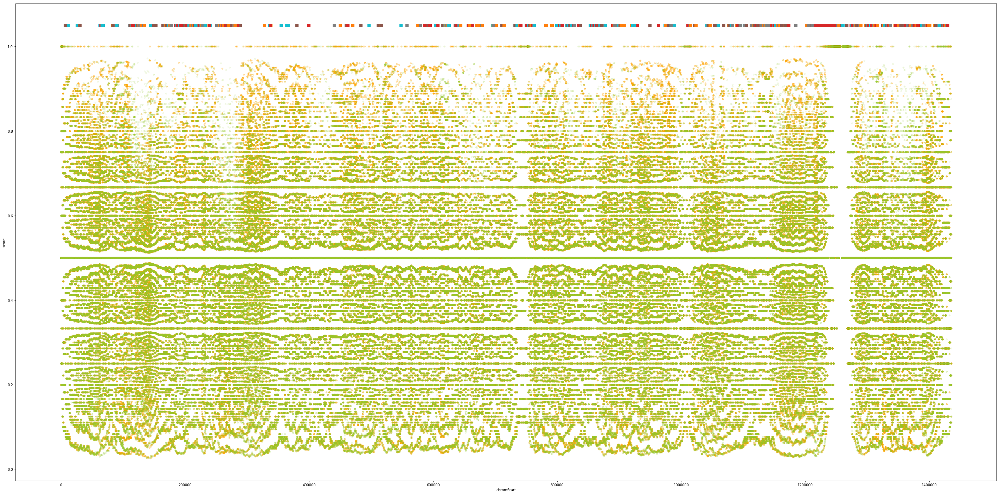

In [121]:
fig, ax = plt.subplots(figsize=(50, 25))
for x1, x2 in zip(gene_df.start, gene_df.end):
    plt.plot((x1,x2), (1.05, 1.05), lw = 8)
tc_df.plot(y='score', x='chromStart', kind='scatter', ax=ax, alpha=0.3, color='orange')
ta_df.plot(y='score', x='chromStart', kind='scatter', ax=ax, alpha=0.1, color='yellowgreen')

In [122]:
len(tc_df)

623128

In [123]:
len(ta_df)

779203

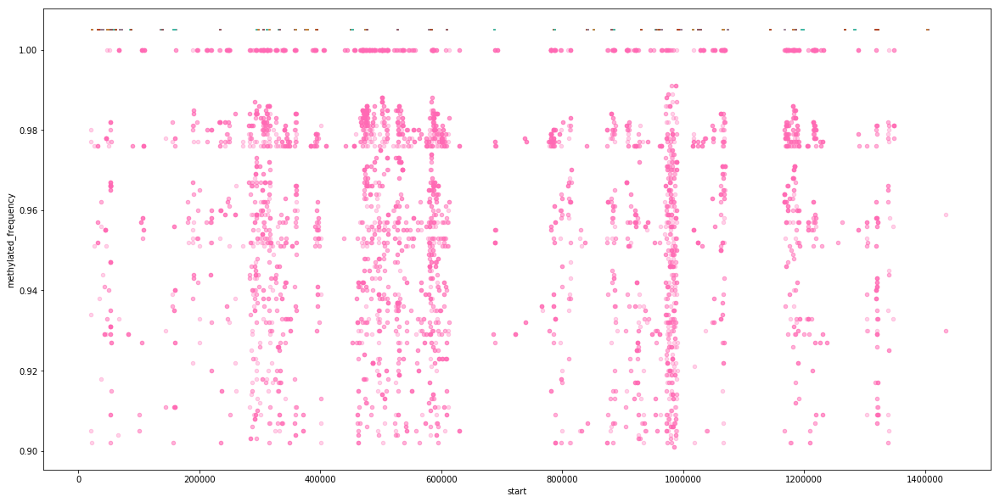

In [66]:
minimap2_hc_df = minimap2_df[(minimap2_df.called_sites > 40) & (minimap2_df.methylated_frequency > 0.9)]
ngmlr_hc_df =ngmlr_df[(ngmlr_df.called_sites > 40) & (ngmlr_df.methylated_frequency > 0.9)]

fig, ax = plt.subplots(figsize=(20, 10))
for x1, x2 in zip(te_df.start, te_df.end):
    plt.plot((x1,x2), (1.005,1.005))
minimap2_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.3, color='hotpink')
#ngmlr_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.1, color='hotpink')

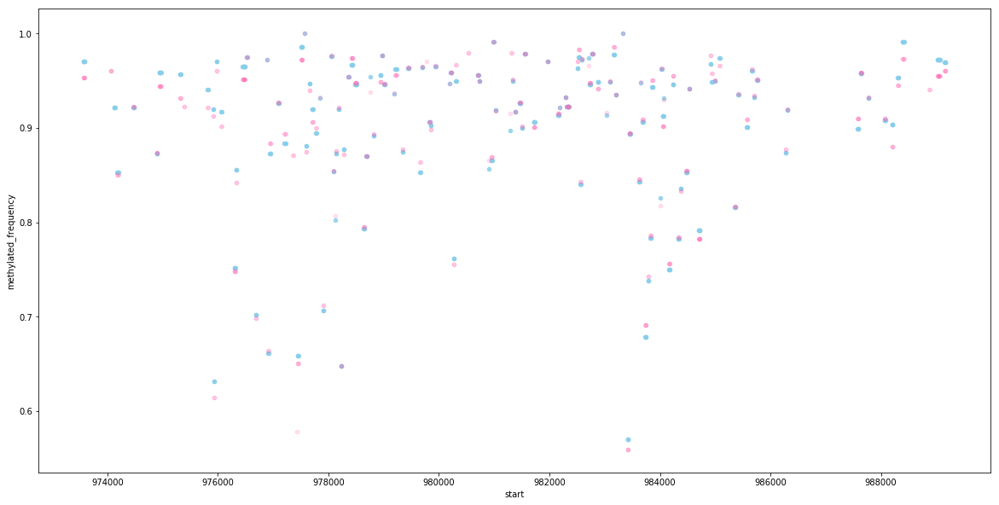

In [25]:
minimap2_hc_df = minimap2_df[(minimap2_df.called_sites > 100)]# & (minimap2_df.methylated_frequency > 0.9)]
ngmlr_hc_df =ngmlr_df[(ngmlr_df.called_sites > 100)]# & (ngmlr_df.methylated_frequency > 0.9)]

fig, ax = plt.subplots(figsize=(20, 10))
minimap2_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.8, color='skyblue')
ngmlr_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.2, color='hotpink')

In [8]:
hist_min = min(minimap2_hc_df.start)
hist_max = max(minimap2_hc_df.start)
          
print(hist_min)
print(hist_max)

648
1434978


In [9]:
print(minimap2_hc_df.head())
print(minimap2_hc_df.tail())

     chromosome  start   end  num_cpgs_in_group  called_sites  \
5   pcontig_019    648   648                  1            11   
6   pcontig_019    655   655                  1            11   
7   pcontig_019    657   657                  1            11   
20  pcontig_019   1377  1377                  1            12   
21  pcontig_019   1384  1384                  1            12   

    called_sites_methylated  methylated_frequency group_sequence  
5                        11                 1.000    split-group  
6                        11                 1.000    split-group  
7                        11                 1.000    split-group  
20                       11                 0.917    split-group  
21                       11                 0.917    split-group  
        chromosome    start      end  num_cpgs_in_group  called_sites  \
46795  pcontig_019  1434884  1434884                  1            28   
46796  pcontig_019  1434924  1434924                  1      

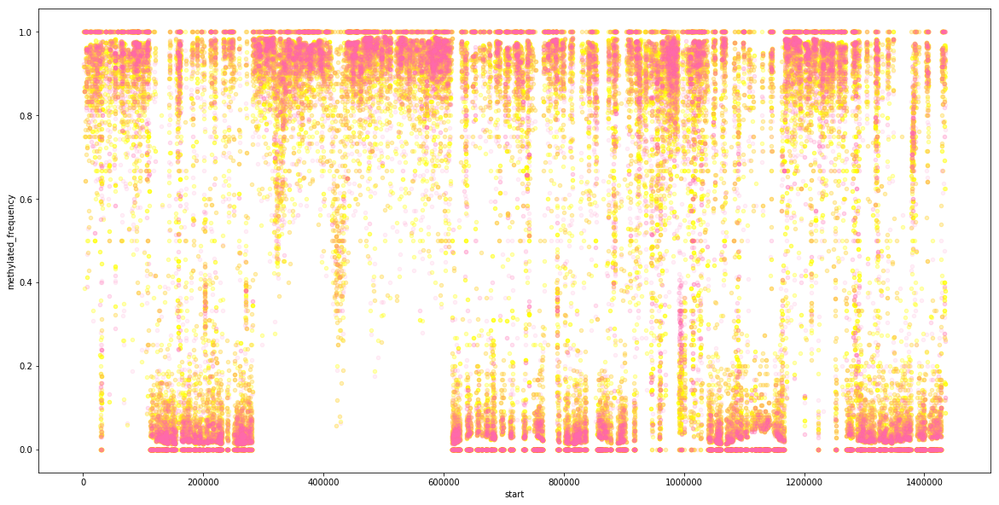

In [25]:
fig, ax = plt.subplots(figsize=(20, 10))
minimap2_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.3, color='yellow')
ngmlr_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.1, color='hotpink')

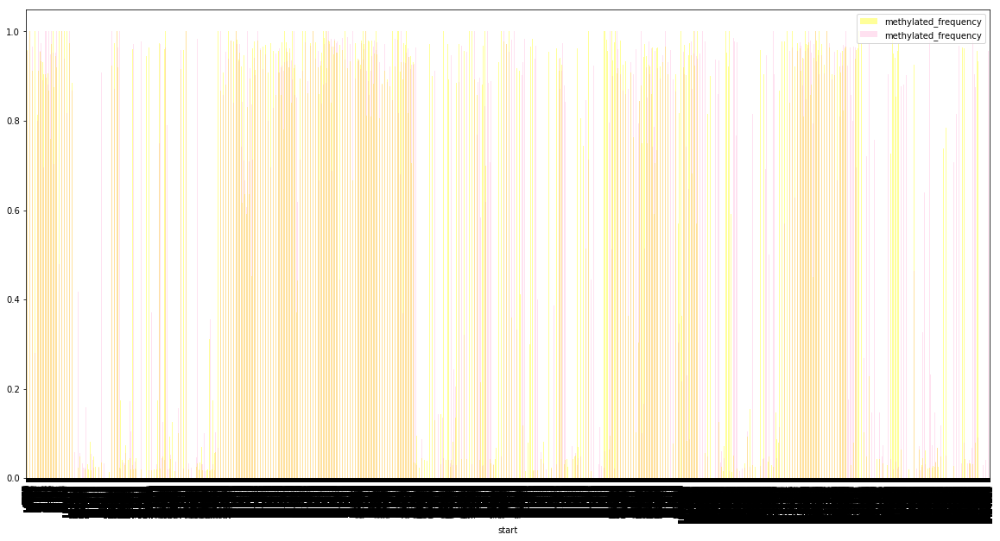

In [16]:
fig, ax = plt.subplots(figsize=(20, 10))
minimap2_hc_df.plot(y='methylated_frequency', x='start', kind='bar', ax=ax, alpha=0.4, color='yellow')
ngmlr_hc_df.plot(y='methylated_frequency', x='start', kind='bar', ax=ax, alpha=0.2, color='hotpink')

In [10]:
minimap2_hc3_df = minimap2_df[(minimap2_df.methylated_frequency >0.9)]
ngmlr_hc3_df =ngmlr_df[ngmlr_df.methylated_frequency >0.9]

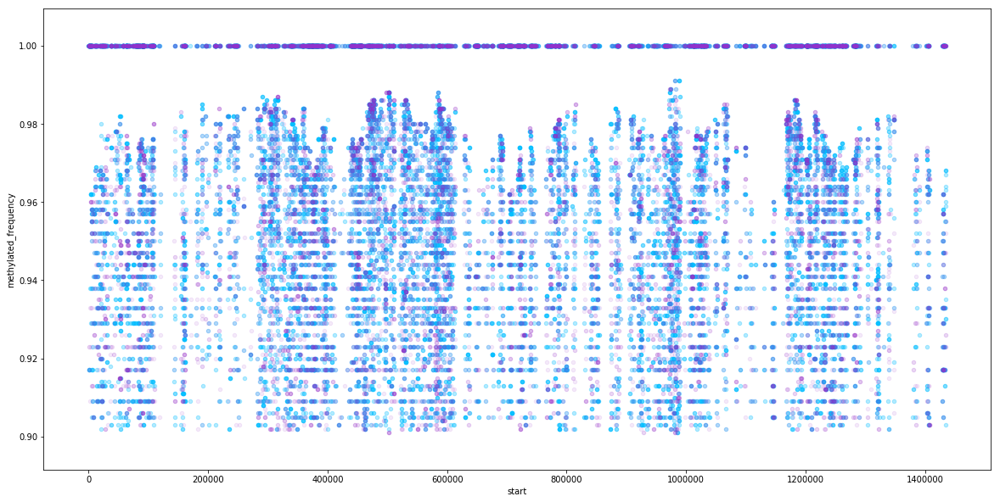

In [18]:
fig, ax = plt.subplots(figsize=(20, 10))
minimap2_hc3_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.3, color='deepskyblue')
ngmlr_hc3_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.1, color='darkorchid')

KeyboardInterrupt: 

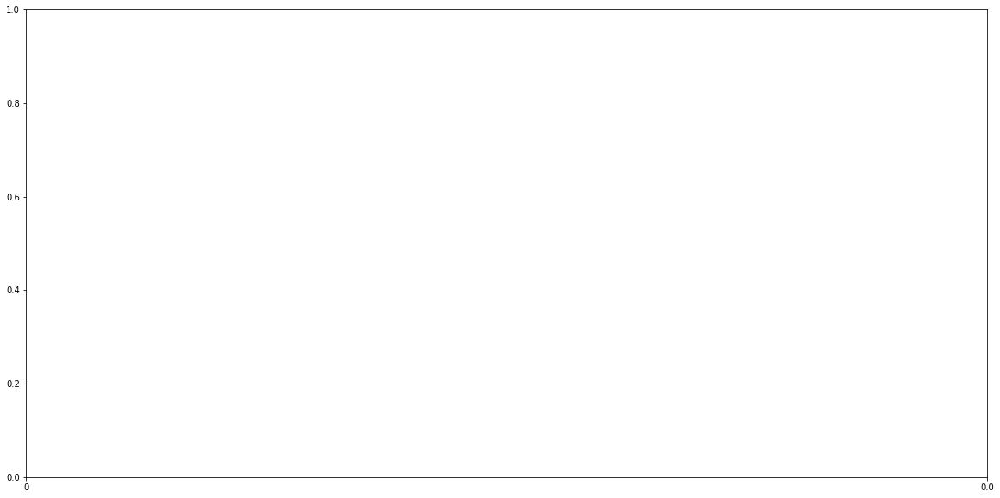

In [11]:
fig, ax = plt.subplots(figsize=(20, 10))
plt.hist(minimap2_hc_df, bins=np.arange(hist_min, hist_max + 100, 100))
minimap2_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.3, color='yellowgreen')
ngmlr_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.1, color='dodgerblue')

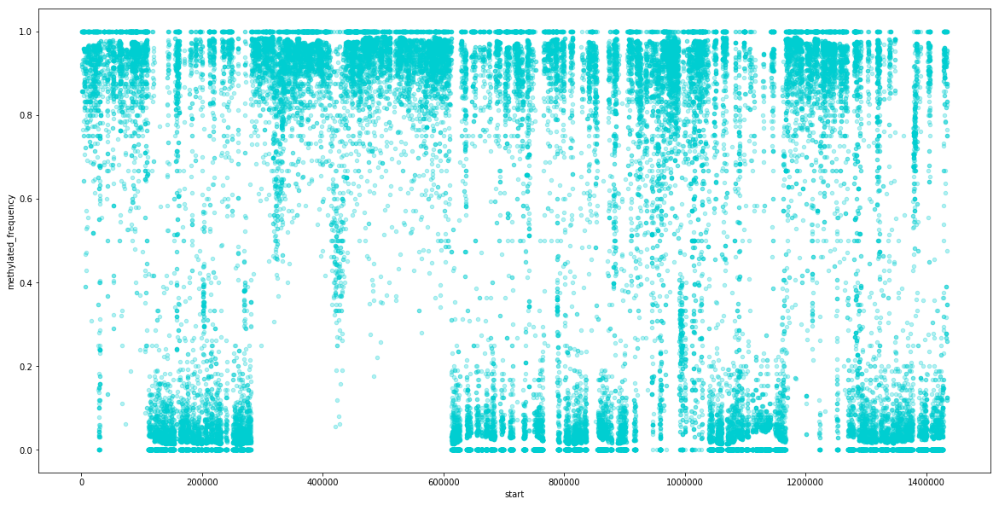

In [59]:
fig, ax = plt.subplots(figsize=(20, 10))
ngmlr_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.3, color='darkturquoise')

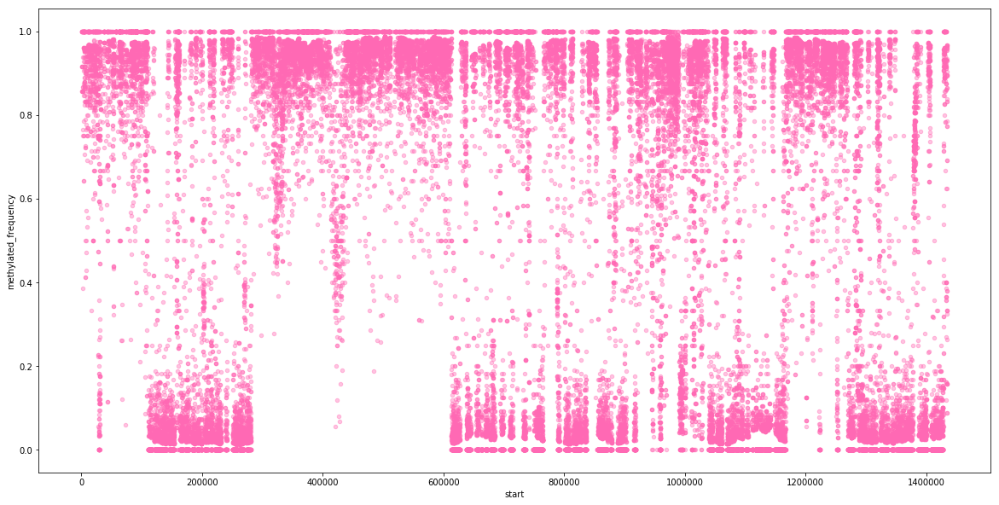

In [27]:
fig, ax = plt.subplots(figsize=(20, 10))
minimap2_hc_df.plot(y='methylated_frequency', x='start', kind='scatter', ax=ax, alpha=0.4, color='hotpink')